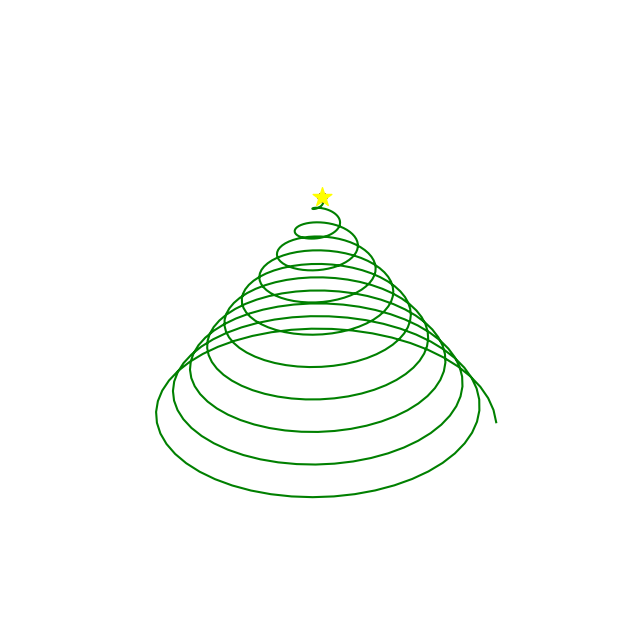

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# 나선형 트리의 좌표를 생성합니다.
turns = 10
theta = np.linspace(0, 2 * np.pi * turns, 500)
z = np.linspace(0, 2, 500)
r = 0.5 * z
x = r * np.sin(theta)
y = r * np.cos(theta)
z = 2 - z

# 나무의 맨 꼭대기 좌표 계산
top_index = np.argmax(z)
top_x, top_y, top_z = x[top_index], y[top_index], z[top_index]

# 애니메이션을 설정합니다.
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(x, y, z, 'g-')
ax.scatter([top_x], [top_y], [top_z], s=200, c='yellow', marker='*')

# 산타들의 초기 위치를 맨 꼭대기 위치로 설정합니다.
num_santas = 7
santa_colors = ['red', 'blue', 'purple', 'orange', 'green', 'pink', 'brown']
santas = [ax.plot([top_x], [top_y], [top_z], 'o', color=color)[0] for color in santa_colors]

# 각 산타의 움직임 속도와 멈추는 위치를 설정합니다.
strides = np.linspace(1, 3, num_santas)
stop_positions = np.linspace(len(x) // 4, len(x) // 2, num_santas).astype(int)

def update(num, x, y, z, santas, strides, stop_positions):
    for i, santa in enumerate(santas):
        if num * strides[i] < stop_positions[i]:
            current_index = (top_index + int(num * strides[i])) % len(x)
            santa.set_data([x[current_index]], [y[current_index]])
            santa.set_3d_properties([z[current_index]])
    ax.view_init(elev=30, azim=num * 360 / len(x))
    return santas

# 애니메이션을 생성합니다.
ani = animation.FuncAnimation(fig, update, frames=int(len(x) // max(strides)),
                              fargs=(x, y, z, santas, strides, stop_positions),
                              interval=50, blit=False)

# 축 설정 제거
ax.axis('off')

# 애니메이션 객체를 HTML로 변환하여 표시합니다.
html_animation = HTML(ani.to_jshtml())
html_animation